<a href="https://colab.research.google.com/github/julesripoll/dqn-pong-breakout/blob/main/Explainability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

## Installations

In [1]:
!pip install Pillow==9.1.1
!pip install gym==0.21
!pip install minatar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.1 MB 13.9 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.5 MB 11.3 MB/s 
  Created wheel for gym: filename=gym-0.21.0-py3-none-any.whl size=1616827 sha256=5a21142b08477226056367b9cfc3b7fa351ee8cdc8ed6a2d043c55a2bb636153
  Stored in directory: /root/.cache/pip/wheels/76/ee/9c/36bfe3e079df99acf5ae57f4e3464ff2771b34447d6d2f2148
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.17.3
    Uninstalling gym-0.17.3:
      Successfully uninstalled gym-0.17.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Importations

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import gym
from PIL import Image
from IPython.display import display, Image as JImage
import imageio
from tqdm.notebook import tqdm
import os

## Get needed files

In [2]:
# run if on colab
!git clone https://github.com/julesripoll/dqn-pong-breakout.git
!mv dqn-pong-breakout/* .
!rm -r dqn-pong-breakout

Cloning into 'dqn-pong-breakout'...
remote: Enumerating objects: 145, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 145 (delta 5), reused 11 (delta 1), pack-reused 114
Receiving objects: 100% (145/145), 238.90 MiB | 25.54 MiB/s, done.
Resolving deltas: 100% (45/45), done.
Checking out files: 100% (23/23), done.


## Jupyter extensions

In [3]:
%load_ext autoreload
%autoreload 2

# Environment

In [4]:
env = gym.make('MinAtar/Breakout-v1')
env.reset();

In [5]:
from utils.utils import state_to_image

def render_env(env):
    """Needed as env.render() did not work by itself"""
    img = state_to_image(env.render('array'))
    plt.imshow(img)
    plt.show()

def render_game(frames, fps=20, show_every_x_frames=1, path='game.gif', size=200):
    processed_frames = []
    for frame in frames[::show_every_x_frames]:
        img = Image.fromarray(state_to_image(frame)).resize((size, size), Image.Resampling.NEAREST)
        processed_frames.append(np.asarray(img))
    imageio.mimwrite(path, processed_frames, fps=fps)
    display(JImage(open(path, 'rb').read()))

def play_game(env, agent=None, fps=20, show_every_x_frames=1, path='game.gif', size=200):
    frames = []
    rewards = 0
    state = env.reset()
    choose_action = lambda s: env.action_space.sample() if agent is None else agent.act(s)
    while True:
        state, r, done, _ = env.step(choose_action(state))
        frames.append(state)
        rewards += r
        if done:
            break
    render_game(frames, fps, show_every_x_frames, path, size)
    print(f"Total rewards: {rewards}")

# Explainability

## Saliency maps and gradient based methods

In [6]:
from agents.double_dqn import DoubleDQNAgent
saving_dir="./networks_weights"
#ddqn = DoubleDQNAgent(env, gamma=0.999, batch_size=256, epsilon_min=0.002, checkpoint_directory=saving_dir)

In [7]:
ddqn_name = "DDQN_lr=5e-4_g=0.999_bs=256_ed=0.9995_em=0.005_ms=500000_ts=2e6_CHECKPOINT=1353052"
ddqn_path = os.path.join(saving_dir, ddqn_name + '.zip')
ddqn = DoubleDQNAgent.load(ddqn_path)


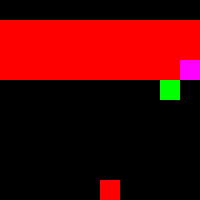

Total rewards: 23


In [8]:
play_game(env, ddqn, path='./ddqn.gif')

In [9]:
def render_game_and_saliency(frames,saliency_frames, fps=1, show_every_x_frames=1, path='saliency.gif', size=200):
    processed_sframes=[]
    processed_frames = []
    for frame in frames[::show_every_x_frames]:
        img = Image.fromarray(state_to_image(frame)).resize((size, size), Image.Resampling.NEAREST)
        processed_frames.append(np.asarray(img))
    imageio.mimwrite(path, processed_frames, fps=fps)
    for frame in saliency_frames[::show_every_x_frames]:
        img = cv2.resize(frame, (size, size))
        cv2.imwrite('tmp.png', 255*img/np.max(img))
        img=cv2.imread('tmp.png')
        processed_sframes.append(np.asarray(img))
    
    imageio.mimwrite(path, np.concatenate((processed_frames,processed_sframes), axis=2), fps=fps)
    display(JImage(open(path, 'rb').read()))


In [10]:
import torch
import cv2

def vanilla_gradient(state, agent):
  state =torch.from_numpy(state).float().unsqueeze(0).cuda() # we need to set the input on GPU before the requires_grad operation!
  state.requires_grad_()
  state.retain_grad()
  action_values = agent.q_network(state)
  action= action_values.argmax()#.detach().numpy())
  action=action_values[0, action]
  action.backward()
  saliency, _ = torch.max(state.grad.data.abs(), dim=3) 
  saliency = saliency.squeeze(0)
  return saliency.cpu().numpy(), state.grad

def smooth_grad(state, agent, n_samples=100, n_noise=4):
  total_gradients=torch.zeros_like(torch.from_numpy(state).float().unsqueeze(0).cuda() )
  for i in range(n_samples):
    noisy_state=brick_noise(state, n_noise)
    _,grad= vanilla_gradient(noisy_state, agent)
    #total_gradients += grad
    #using the square of the gradients generates smoother visualizations
    total_gradients += grad * grad
  total_gradients /= n_samples
  saliency,_ = torch.max(total_gradients.data.abs(), dim=3) 
  saliency = saliency.squeeze(0)
  return saliency.cpu().numpy(), total_gradients



def explain_game( env, agent=None, method='saliency',fps=20, show_every_x_frames=1, path='game_saliency.gif', size=200) :
    if method=="saliency" :
      function=vanilla_gradient
    elif method=="smoothgrad":
      function=smooth_grad
    frames = []
    frame_saliency= []
    rewards = 0
    state = env.reset()
    choose_action = lambda s: env.action_space.sample() if agent is None else agent.act(s)
    while True:
        saliency,_= function(state, agent)  
        state, r, done, _ = env.step(choose_action(state))
        frames.append(state)
        frame_saliency.append(saliency)
        rewards += r
        if done:
            break
    render_game_and_saliency(frames, frame_saliency,fps, show_every_x_frames, path, size)
    print(f"Total rewards: {rewards}")



In [12]:
state=env.reset()

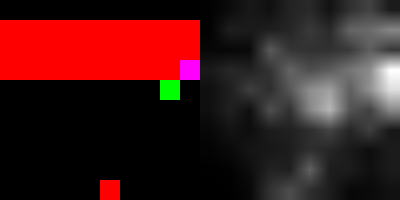

Total rewards: 17


In [11]:
explain_game( env, ddqn,fps=2,method='saliency', path="game_saliency.gif")

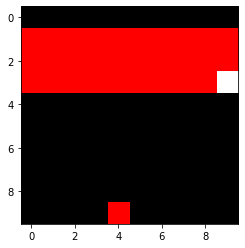

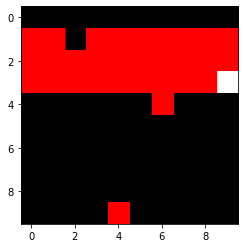

In [13]:
def brick_noise(state, n_noise=2):
  '''
  add noise (for bricks presence, to a given state --> change n_noise bricks (present or not)
  '''
  noisy_state=state.copy()
  for i in range(n_noise):
    x=np.random.randint(0,state.shape[0]/2)
    y=np.random.randint(0,state.shape[1])
    noisy_state[x,y,3]=False if state[x,y,3] else True

  return noisy_state



plt.imshow(state_to_image(state))
plt.show()
plt.imshow(state_to_image(brick_noise(state)))


(-0.5, 9.5, 9.5, -0.5)

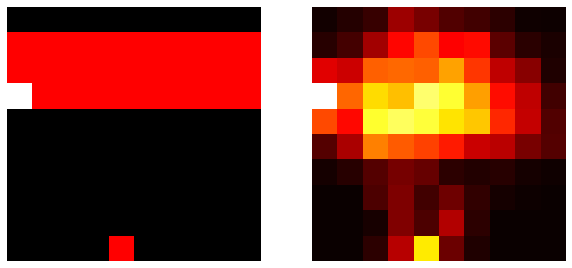

In [14]:
state=env.reset()
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.imshow(state_to_image(state))
plt.axis('off')

saliency,_=smooth_grad(state, ddqn)

plt.subplot(1,2,2)
plt.imshow(saliency, cmap='hot')
plt.axis('off')


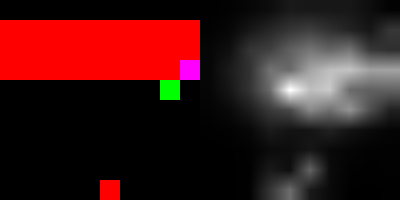

Total rewards: 33


In [17]:
explain_game( env, ddqn,fps=2,method='smoothgrad', path="game_smoothgrad.gif")